In [2]:
!nvidia-smi

Sun Nov  2 20:24:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8             10W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Import And Split**

In [3]:
# ============================================================
# 0. Setup
# ============================================================
!pip install -q ultralytics

from ultralytics import YOLO
from pathlib import Path
import yaml, shutil, random, xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Dataset paths
BASE  = Path("/kaggle/input/bangladesh-traffic/Bangladeshi Traffic Flow Dataset/Annotated Images")
WORK  = Path("/kaggle/working/traffic_baseline")
SPLIT = WORK / "yolo_split"
DATA  = WORK / "data_traffic.yaml"
WORK.mkdir(parents=True, exist_ok=True)

# Custom folder for all outputs
OUTPUT_FOLDER = Path("/kaggle/working/base_yolov11")
OUTPUT_FOLDER.mkdir(parents=True, exist_ok=True)

# ============================================================
# 1. VOC → YOLO conversion + train/val/test split
# ============================================================
def voc2yolo(xml_file, classes, out_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    size = root.find("size")
    w, h = int(size.find("width").text), int(size.find("height").text)

    with open(out_file, "w") as f:
        for obj in root.iter("object"):
            cls = obj.find("name").text
            if cls not in classes:
                continue
            cls_id = classes.index(cls)

            xmlbox = obj.find("bndbox")
            xmin, ymin = float(xmlbox.find("xmin").text), float(xmlbox.find("ymin").text)
            xmax, ymax = float(xmlbox.find("xmax").text), float(xmlbox.find("ymax").text)

            x = (xmin + xmax) / 2.0 / w
            y = (ymin + ymax) / 2.0 / h
            bw = (xmax - xmin) / w
            bh = (ymax - ymin) / h
            f.write(f"{cls_id} {x:.6f} {y:.6f} {bw:.6f} {bh:.6f}\n")

def create_split(all_files, ratios=(0.7,0.2,0.1)):
    n = len(all_files)
    n_train = int(ratios[0]*n)
    n_val   = int(ratios[1]*n)
    random.shuffle(all_files)
    return (all_files[:n_train],
            all_files[n_train:n_train+n_val],
            all_files[n_train+n_val:])

def convert_and_split(base_dir, classes, ratios=(0.7,0.2,0.1)):
    if SPLIT.exists():
        shutil.rmtree(SPLIT)

    all_pairs = []
    for ext in ["*.jpg","*.jpeg","*.png","*.JPG","*.JPEG","*.PNG"]:
        for img_file in Path(base_dir).rglob(ext):
            xml_file = img_file.with_suffix(".xml")
            if xml_file.exists():
                all_pairs.append((img_file, xml_file))

    print(f"Found {len(all_pairs)} annotated images total.")
    train, val, test = create_split(all_pairs, ratios)
    splits = {"train":train, "val":val, "test":test}

    for split_name, files in splits.items():
        out_im, out_lb = SPLIT/split_name/"images", SPLIT/split_name/"labels"
        out_im.mkdir(parents=True, exist_ok=True)
        out_lb.mkdir(parents=True, exist_ok=True)

        for img_file, xml_file in files:
            shutil.copy(img_file, out_im/img_file.name)
            voc2yolo(xml_file, classes, out_lb/f"{img_file.stem}.txt")
        print(f"{split_name}: {len(files)} images")

# Classes in dataset
CLASSES = ["Rickshaw","Bus","Truck","Bike","Mini-truck","People","Car","CNG","Cycle"]

print("➤ Converting Pascal VOC → YOLO with auto split …")
convert_and_split(BASE, CLASSES, ratios=(0.7,0.2,0.1))

# Create data.yaml for YOLOv11
DATA.write_text(yaml.dump({
    "path": str(SPLIT),
    "train": "train/images",
    "val": "val/images",
    "test": "test/images",
    "nc": len(CLASSES),
    "names": CLASSES
}))
print("✓ YOLO split ready:", DATA)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.2 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.9 MB/s eta 0:00:00:00:0100:01
Creating new Ultral

In [4]:
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
import seaborn as sns
import pandas as pd 
from collections import Counter
import yaml
from PIL import Image
import shutil

**Train Yolo Baseline**

In [6]:
# Load the YAML file
yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"  # Update this
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)

# Extract class names
class_names = data_yaml["names"]
num_classes = data_yaml["nc"]

print(f"Number of classes: {num_classes}")
print(f"Class names: {class_names}")

Number of classes: 9
Class names: ['Rickshaw', 'Bus', 'Truck', 'Bike', 'Mini-truck', 'People', 'Car', 'CNG', 'Cycle']


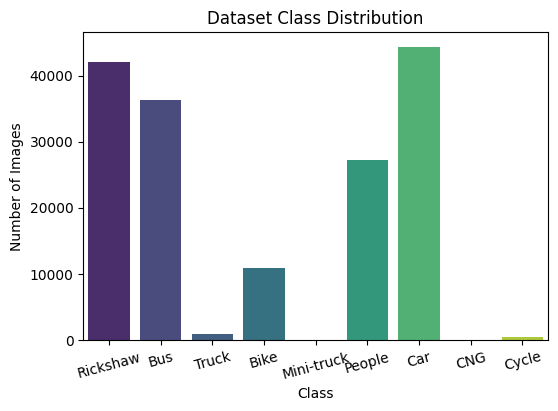

In [7]:
# Define paths
base_path = "/kaggle/working/traffic_baseline/yolo_split/train/labels"  # Update this

# Count occurrences of each class in the dataset
class_counts = {name: 0 for name in class_names}

for label_file in os.listdir(base_path):
    with open(os.path.join(base_path, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_idx = int(line.split()[0])  # Get class index
            class_counts[class_names[class_idx]] += 1
class_counts_df = pd.DataFrame(class_counts.items(), columns=["Class", "Count"])

# Plot class distribution
plt.figure(figsize=(6, 4))
sns.barplot(data=class_counts_df, x="Class", y="Count", palette="viridis")
plt.title("Dataset Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.show()

In [8]:
import os
import collections

# Define paths
label_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

# Count labels per class
class_counts = collections.defaultdict(int)

# Read label files
for label_file in os.listdir(label_dir):
    with open(os.path.join(label_dir, label_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID (assuming first value in YOLO format)
            class_counts[class_id] += 1

# Print class distribution
print("Class Distribution Before Balancing:")
for class_id, count in sorted(class_counts.items()):
    print(f"Class {class_id}: {count} images")

# Find the target count (max of any class)
target_count = min(class_counts.values())
print(f"\nTarget count for all classes: {target_count}")

Class Distribution Before Balancing:
Class 0: 42050 images
Class 1: 36360 images
Class 2: 919 images
Class 3: 11001 images
Class 5: 27203 images
Class 6: 44324 images
Class 8: 492 images

Target count for all classes: 492


In [9]:
import shutil
import random

# Define paths
train_images_dir = "/kaggle/working/traffic_baseline/yolo_split/train/images"
train_labels_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

# Target count (smallest class count)
target_count = min(class_counts.values())  # 503 in this case

# Get all class 0 files
class_0_files = []
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            if int(line.split()[0]) == 0:  # Check if it's Class 0
                class_0_files.append(lbl_file)
                break  # Only need to check the first line

# Randomly select Class 0 files to keep
files_to_keep = set(random.sample(class_0_files, target_count))
files_removed = []

# Remove extra files
for lbl_file in class_0_files:
    if lbl_file not in files_to_keep:
        img_file = lbl_file.replace(".txt", ".jpg")

        src_label = os.path.join(train_labels_dir, lbl_file)
        src_image = os.path.join(train_images_dir, img_file)

        # Move to a backup folder instead of deleting (optional)
        backup_dir = "/kaggle/working/removed_samples"
        os.makedirs(backup_dir, exist_ok=True)
        shutil.move(src_label, os.path.join(backup_dir, lbl_file))
        shutil.move(src_image, os.path.join(backup_dir, img_file))

        files_removed.append(lbl_file)

print("\n✅ **Undersampling Completed!**")
print(f"🗑 Removed {len(files_removed)} files from Class 0")


✅ **Undersampling Completed!**
🗑 Removed 13101 files from Class 0


In [11]:
# Recalculate class distribution after undersampling
from collections import Counter
import os

train_labels_dir = "/kaggle/working/traffic_baseline/yolo_split/train/labels"

final_class_counts = Counter()
for lbl_file in os.listdir(train_labels_dir):
    with open(os.path.join(train_labels_dir, lbl_file), "r") as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])  # Extract class ID
            final_class_counts[class_id] += 1

print("\n✅ **Final Class Distribution After Undersampling:**")
for class_id, count in final_class_counts.items():
    print(f"Class {class_id}: {count} images")


✅ **Final Class Distribution After Undersampling:**
Class 0: 1498 images
Class 6: 8794 images
Class 5: 2871 images
Class 1: 5294 images
Class 3: 1692 images
Class 2: 308 images
Class 8: 68 images


In [12]:
import yaml

# Path to data.yaml in the working directory
yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"

# Load the existing YAML file
with open(yaml_path, "r") as file:
    data = yaml.safe_load(file)

# Add/Modify augmentation settings (YOLOv12 supports these augmentations)
data["augment"] = {
    "mosaic": True,
    "mixup": 0.2,
    "hsv_h": 0.015,
    "hsv_s": 0.7,
    "hsv_v": 0.4,
    "perspective": 0.0005,
    "shear": 0.0001,
    "flipud": 0.5,
    "fliplr": 0.5,
    "rotate": 5.0,
    "scale": 0.5
}

# Save the updated YAML file
with open(yaml_path, "w") as file:
    yaml.dump(data, file, default_flow_style=False)

print("✅ `data.yaml` updated successfully with on-the-fly augmentations!")

✅ `data.yaml` updated successfully with on-the-fly augmentations!


✅ Image loaded successfully!


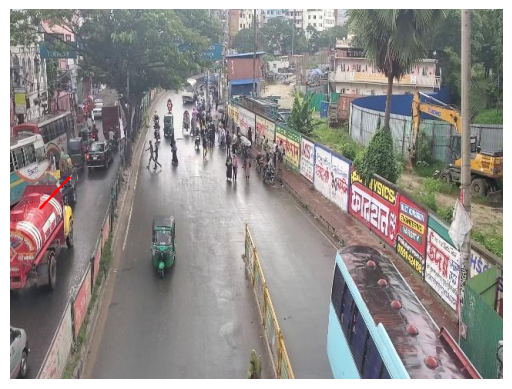

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_path = "/kaggle/working/traffic_baseline/yolo_split/train/images/frame0_jpg.rf.4414dca39a1e1b2a186d9ea94500f025.jpg"
label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
# Ensure the image exists before processing
if os.path.exists(img_path):
    img = cv2.imread(img_path)
    
    if img is not None:  # Check if image is successfully read
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        print("✅ Image loaded successfully!")
    else:
        print("⚠️ Error: Image could not be loaded. Possible corruption:", img_path)
else:
    print("❌ Image path does not exist:", img_path)
# Example: Load an image and overlay its polygon annotation


# Read image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Read annotations
with open(label_path, "r") as f:
    lines = f.readlines()

for line in lines:
    values = list(map(float, line.split()))
    class_id = int(values[0])
    polygon = values[1:]  # Polygon coordinates

    # Convert YOLO polygon format to image points
    points = [(int(polygon[i] * img.shape[1]), int(polygon[i+1] * img.shape[0])) for i in range(0, len(polygon), 2)]
    
    # Draw polygon
    cv2.polylines(img, [np.array(points)], isClosed=True, color=(255, 0, 0), thickness=2)

# Show image with annotations
plt.imshow(img)
plt.axis("off")
plt.show()

In [14]:
import yaml

# Define the correct paths for your dataset
data_yaml_path = "/kaggle/working/traffic_baseline/data_traffic.yaml"  # Save in working directory

correct_paths = {
    "train": "/kaggle/working/traffic_baseline/yolo_split/train/images",  # Update this path
    "val": "/kaggle/working/traffic_baseline/yolo_split/val/images",  # Update this path
    "test": "/kaggle/working/traffic_baseline/yolo_split/test",  # Update this path
    "nc": 9,  # Number of classes
    "names": ['Rickshaw', 'Bus', 'Truck', 'Bike', 'Mini-truck', 'People', 'Car', 'CNG', 'Cycle']  # Class names
}

# Save the updated data.yaml
with open(data_yaml_path, "w") as file:
    yaml.dump(correct_paths, file, default_flow_style=False)

print(f"✅ Updated data.yaml saved at: {data_yaml_path}")

✅ Updated data.yaml saved at: /kaggle/working/traffic_baseline/data_traffic.yaml


In [15]:
pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [24]:
from ultralytics import YOLO
model = YOLO("yolo11l.pt")

In [25]:
import time

# Start time
start_time = time.time()

# Train the model
results = model.train(
   data='/kaggle/working/traffic_baseline/data_traffic.yaml',
   imgsz=128,
   epochs=2,
   batch=16,
   name='yolo11l.pt',
)

# End time
end_time = time.time()

# Calculate total time taken
total_time = end_time - start_time
minutes = int(total_time // 60)
seconds = int(total_time % 60)

# Display training summary
print(f"✅ Training Completed!")
print(f"🕒 Time Taken: {minutes} min {seconds} sec")
print(f"🔄 Total Epochs: {results.epochs}")

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/traffic_baseline/data_traffic.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=128, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11l.pt3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspect

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       4735      46700      0.411      0.237        0.2     0.0901
              Rickshaw       3906      12284       0.35      0.187      0.178      0.054
                   Bus       3922      10408      0.351      0.529      0.406      0.186
                 Truck        248        270     0.0682      0.144     0.0721     0.0481
                  Bike       2140       3227      0.335      0.144      0.133     0.0375
                People       2911       7837      0.355     0.0339     0.0735     0.0181
                   Car       4253      12533      0.418      0.621      0.533      0.285
                 Cycle        134        141          1          0    0.00711    0.00156
Speed: 0.0ms preprocess, 1.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/yolo11l.pt3
✅ Training Completed!
🕒 Time Taken: 2 min 22 sec


AttributeError: 'DetMetrics' object has no attribute 'epochs'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP).

    Attributes:
        names (dict[int, str]): A dictionary of class names.
        box (Metric): An instance of the Metric class for storing detection results.
        speed (dict[str, float]): A dictionary for storing execution times of different parts of the detection process.
        task (str): The task type, set to 'detect'.
        stats (dict[str, list]): A dictionary containing lists for true positives, confidence scores, predicted classes, target classes, and target images.
        nt_per_class: Number of targets per class.
        nt_per_image: Number of targets per image.

    Methods:
        update_stats: Update statistics by appending new values to existing stat collections.
        process: Process predicted results for object detection and update metrics.
        clear_stats: Clear the stored statistics.
        keys: Return a list of keys for accessing specific metrics.
        mean_results: Calculate mean of detected objects & return precision, recall, mAP50, and mAP50-95.
        class_result: Return the result of evaluating the performance of an object detection model on a specific class.
        maps: Return mean Average Precision (mAP) scores per class.
        fitness: Return the fitness of box object.
        ap_class_index: Return the average precision index per class.
        results_dict: Return dictionary of computed performance metrics and statistics.
        curves: Return a list of curves for accessing specific metrics curves.
        curves_results: Return a list of computed performance metrics and statistics.
        summary: Generate a summarized representation of per-class detection metrics as a list of dictionaries.
    

In [26]:
import shutil

# Define the folder path and output ZIP file
source_folder = "/kaggle/working/runs/detect/yolo11l.pt"  # Folder you want to zip
zip_path = "/kaggle/working/yolo11l.zip"  # Output ZIP file

# Create the ZIP file
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', source_folder)

print(f"✅ ZIP file created: {zip_path}")

✅ ZIP file created: /kaggle/working/yolo11l.zip


In [28]:
from ultralytics import YOLO

# Load your trained YOLOv12 model
model = YOLO("/kaggle/working/runs/detect/yolo11l.pt2/weights/best.pt")

# Run validation on the test/valid dataset
metrics = model.val(data="/kaggle/working/traffic_baseline/data_traffic.yaml")

# Print all metrics
print("\n📊 **Full YOLO Model Evaluation Report:**")
print(metrics)

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l summary (fused): 190 layers, 25,286,251 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1574.9±255.3 MB/s, size: 69.9 KB)
val: Scanning /kaggle/working/traffic_baseline/yolo_split/val/labels.cache... 4735 images, 14 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4735/4735 7.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 296/296 12.8it/s 23.1s0.2ss


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       4735      46700       0.41      0.237        0.2     0.0903
              Rickshaw       3906      12284       0.35      0.188      0.178     0.0541
                   Bus       3922      10408      0.351      0.529      0.407      0.187
                 Truck        248        270     0.0681      0.144     0.0724     0.0482
                  Bike       2140       3227      0.332      0.142      0.132     0.0374
                People       2911       7837      0.351     0.0336     0.0731     0.0181
                   Car       4253      12533      0.418      0.621      0.533      0.286
                 Cycle        134        141          1          0    0.00708    0.00158
Speed: 0.1ms preprocess, 1.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

📊 **Full YOLO Model Evaluation Report:**
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 8])
box: ult

<Figure size 1000x600 with 0 Axes>

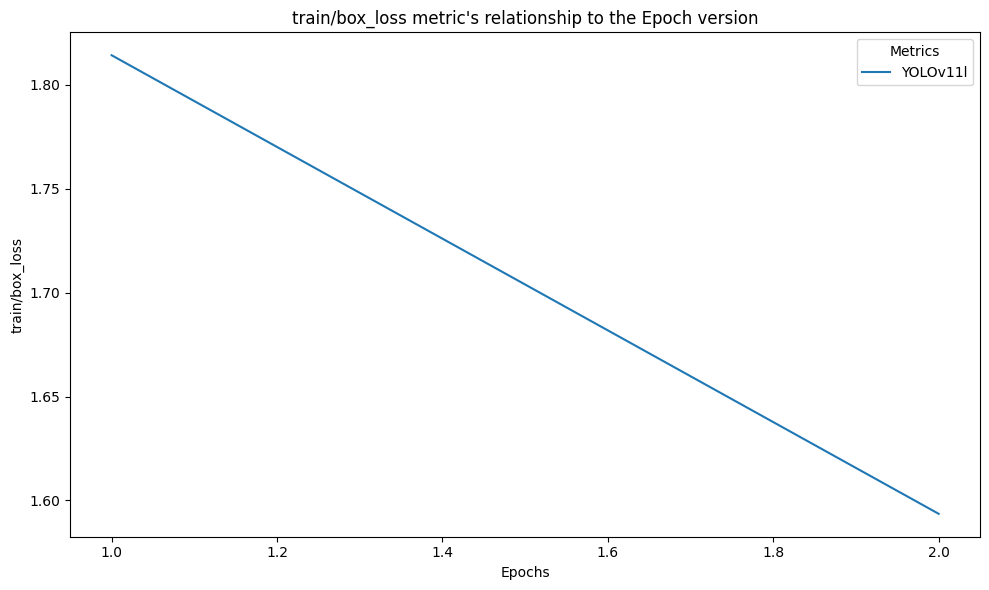

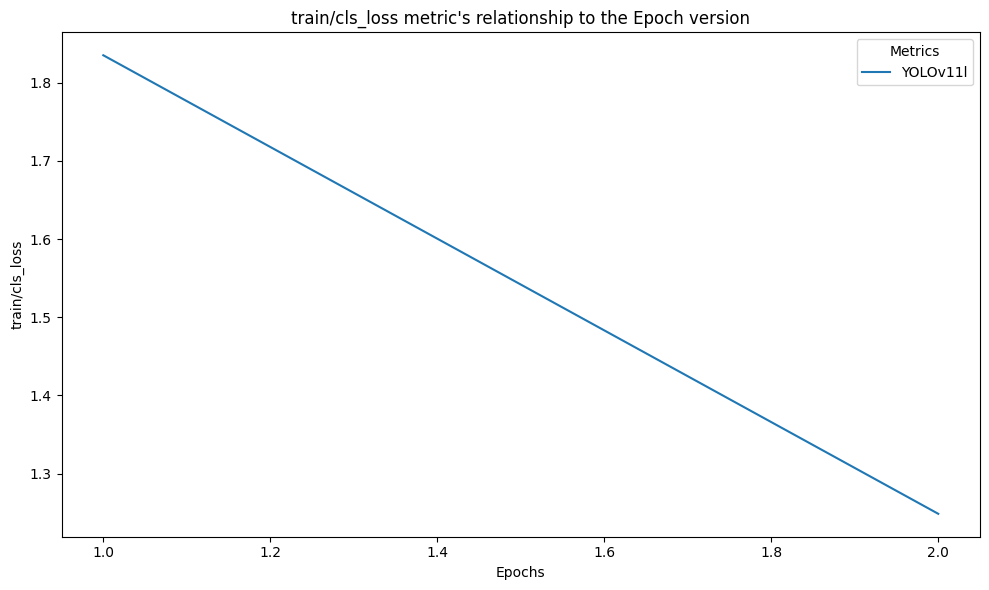

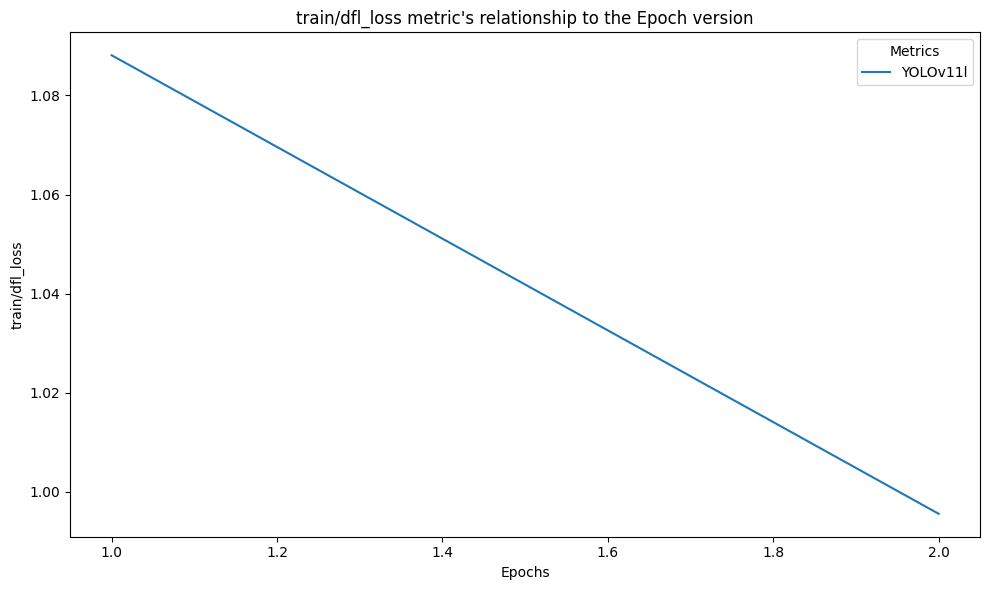

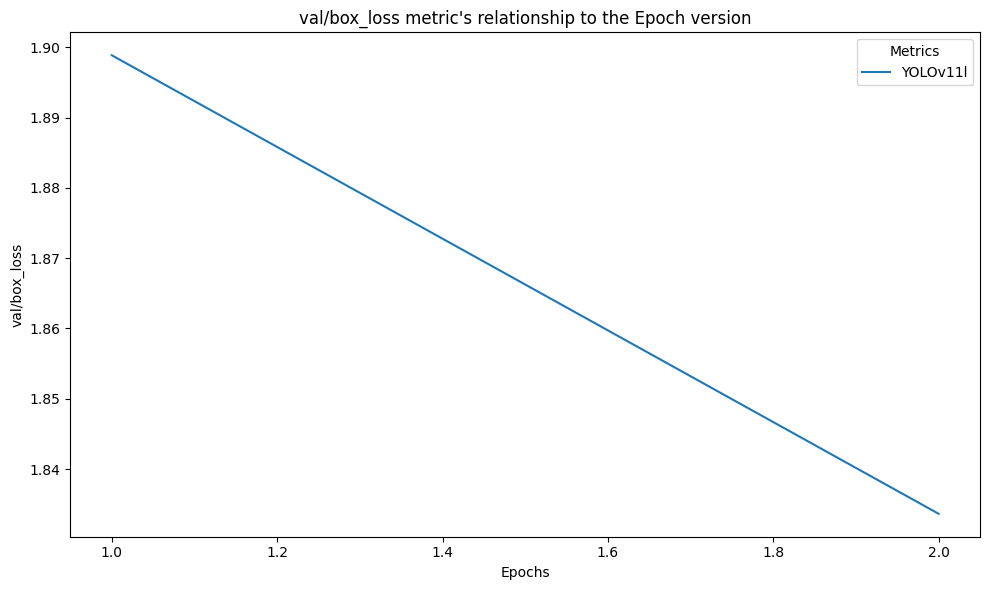

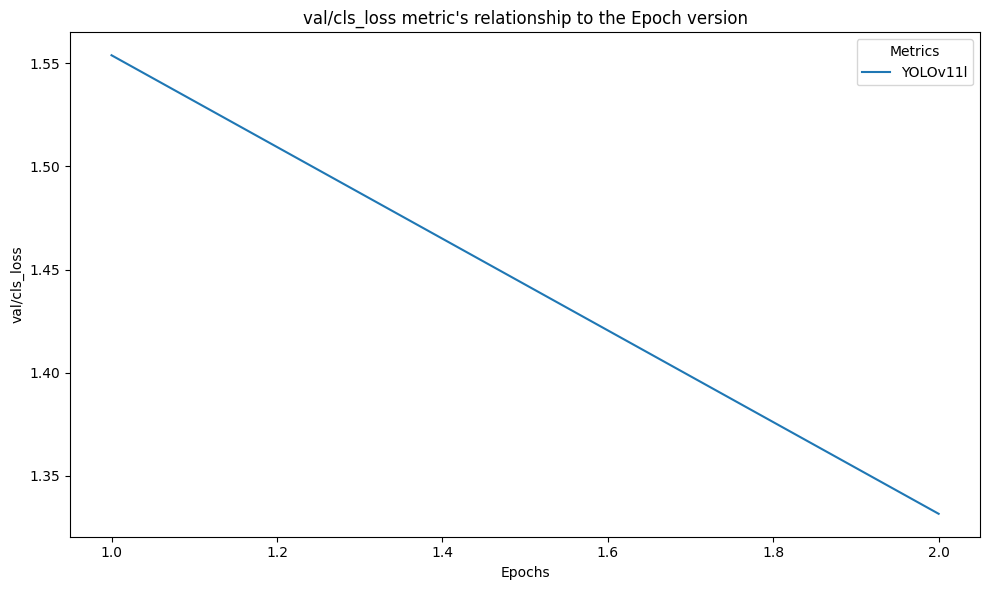

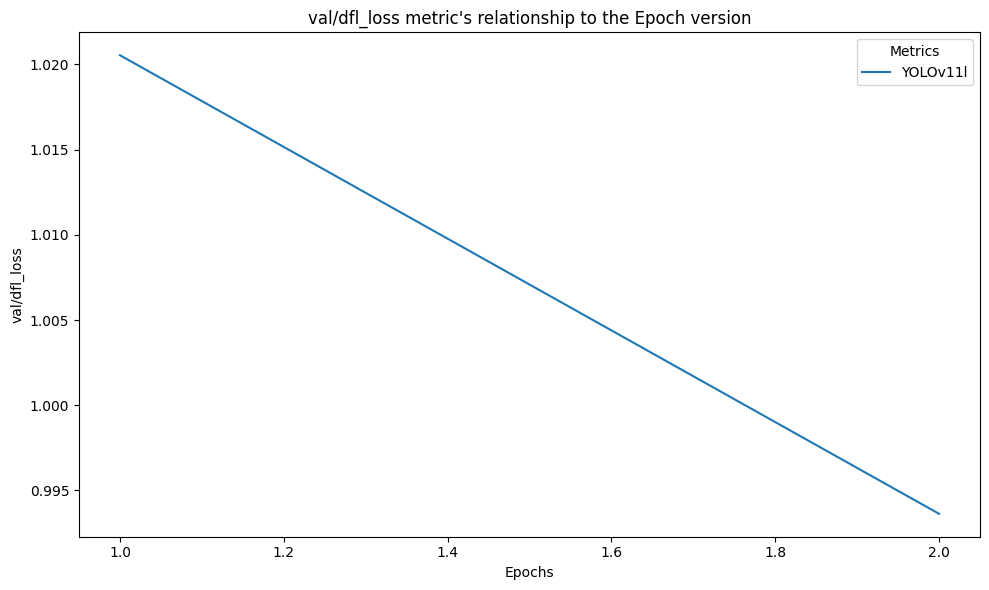

In [30]:
import pandas as pd
import seaborn as sns 

df = pd.read_csv('/kaggle/working/runs/detect/yolo11l.pt2/results.csv')

metrics = ['train/box_loss','train/cls_loss','train/dfl_loss','val/box_loss','val/cls_loss','val/dfl_loss']

plt.figure(figsize=(10, 6))

for metric in metrics:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='epoch', y=metric, data=df, label="YOLOv11l")
    
    plt.title(f"{metric} metric's relationship to the Epoch version")
    plt.xlabel("Epochs")
    plt.ylabel(f"{metric}")
    plt.legend(title="Metrics")
    plt.tight_layout()
    
    plt.show()

**Evaluate**

In [35]:
paths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/val'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)
print(len(paths2))
print(paths2[0:3])

12
['/kaggle/working/runs/detect/val/BoxF1_curve.png', '/kaggle/working/runs/detect/val/BoxPR_curve.png', '/kaggle/working/runs/detect/val/BoxP_curve.png']


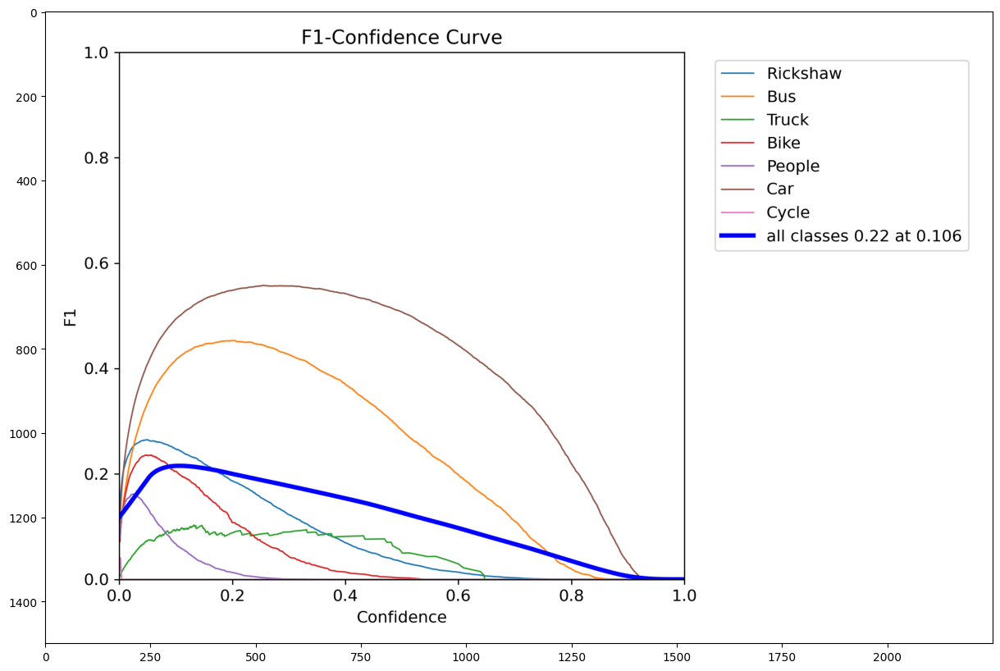

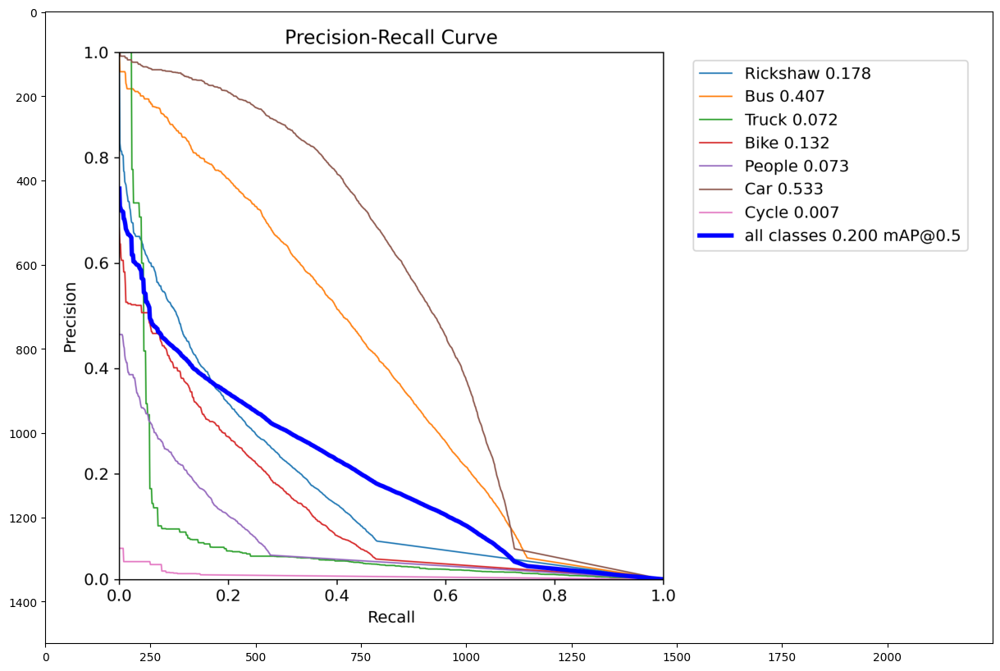

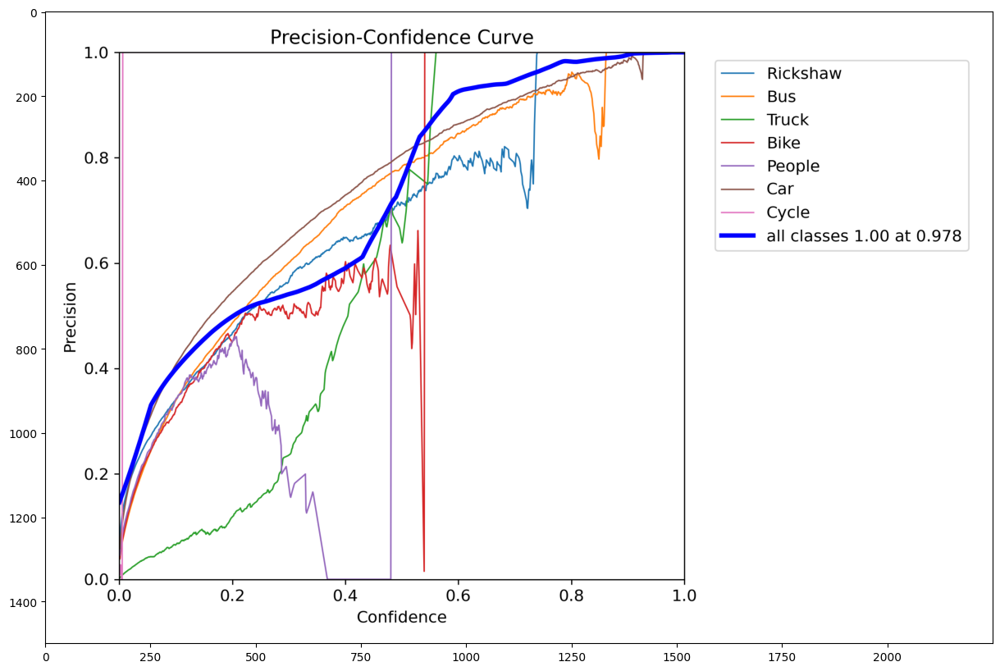

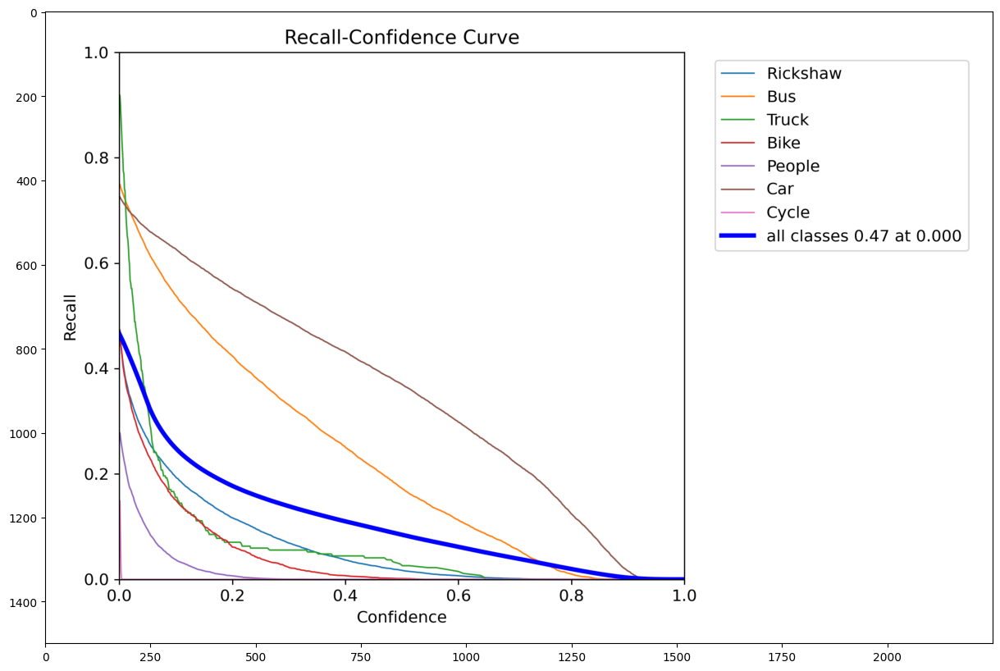

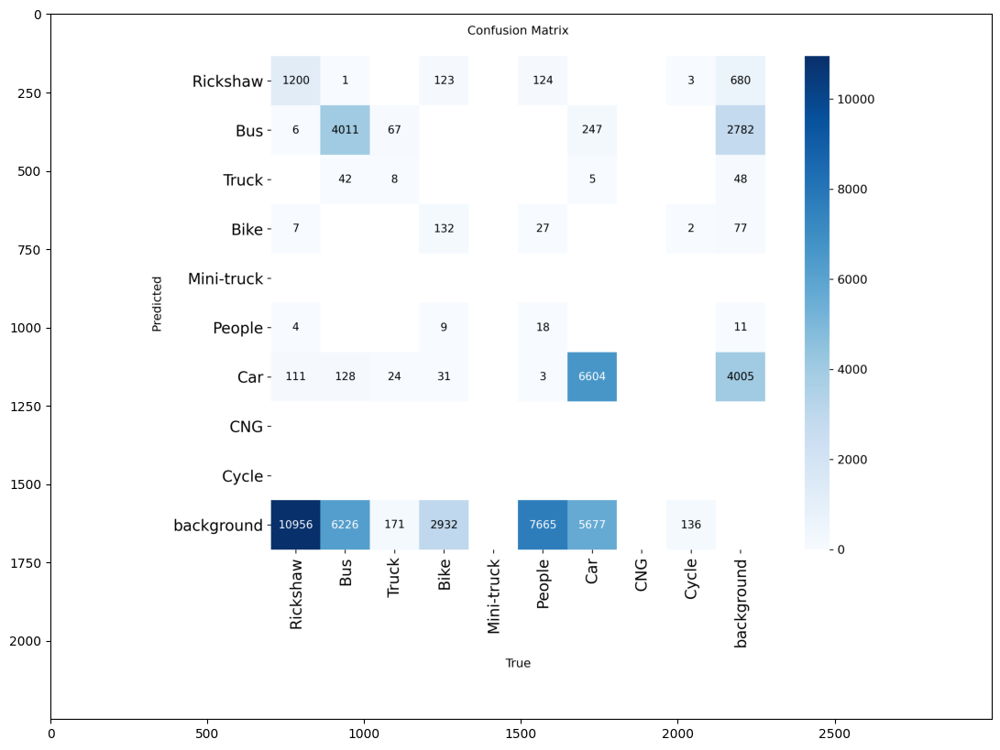

...

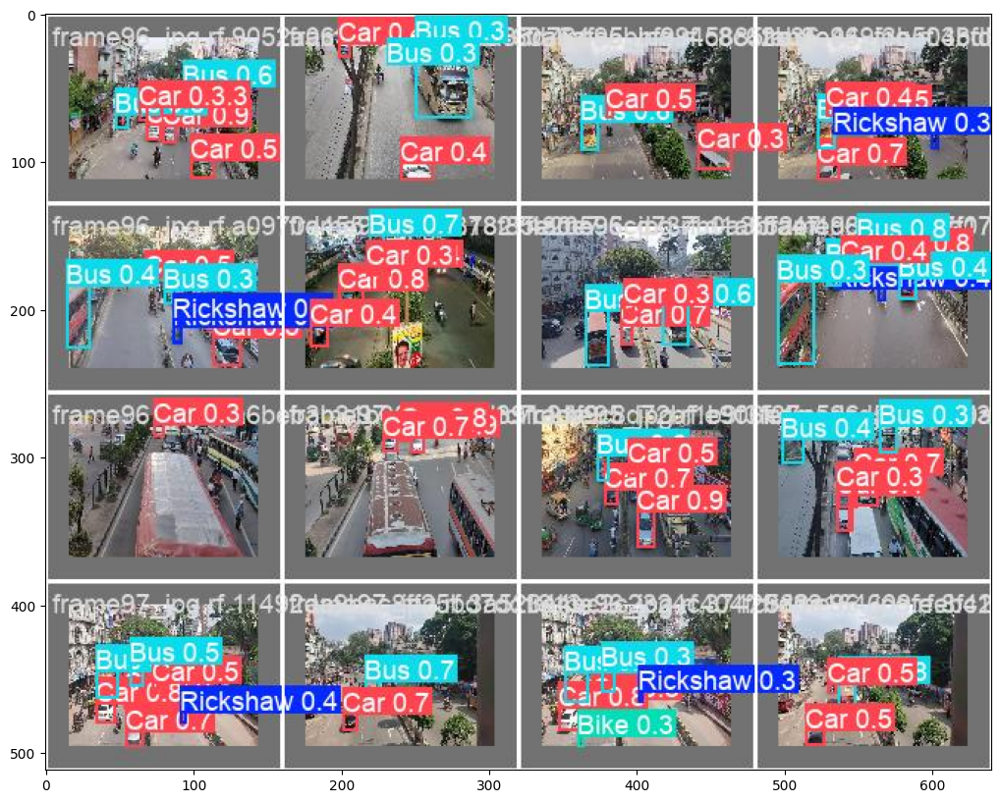

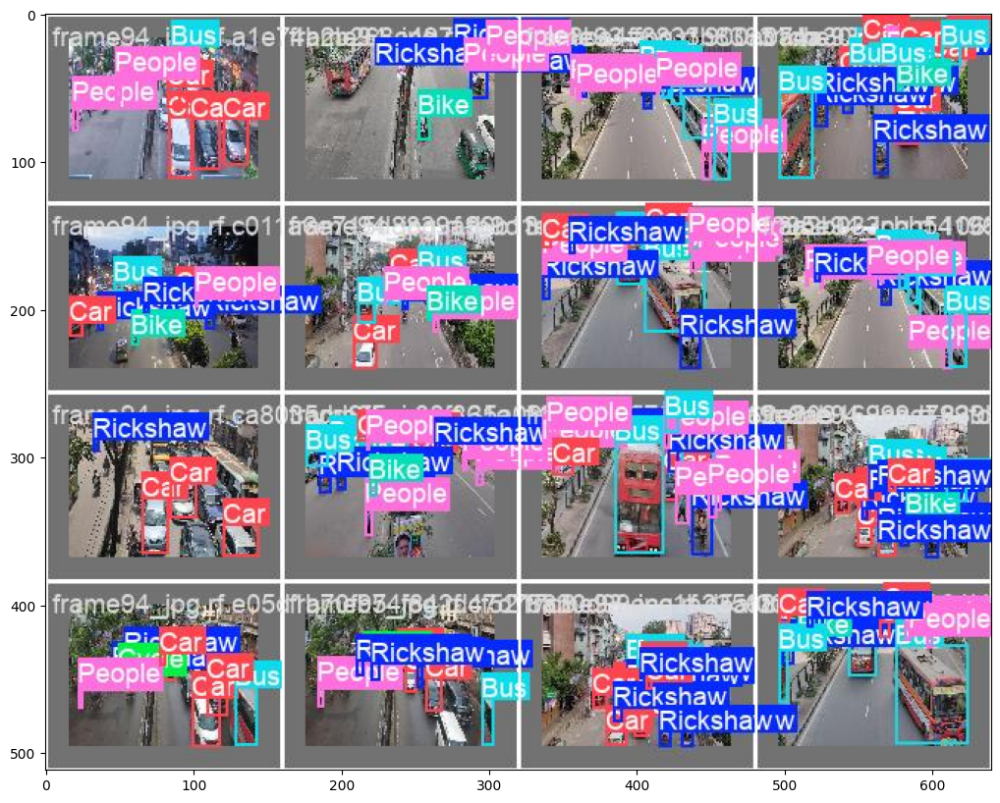

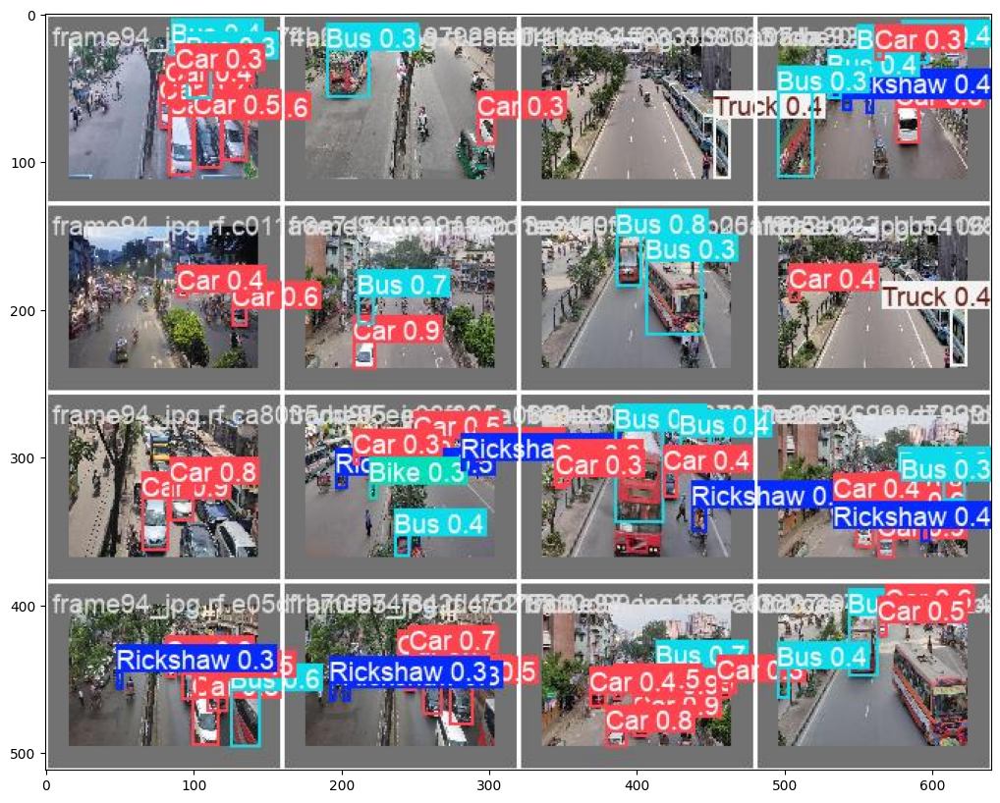

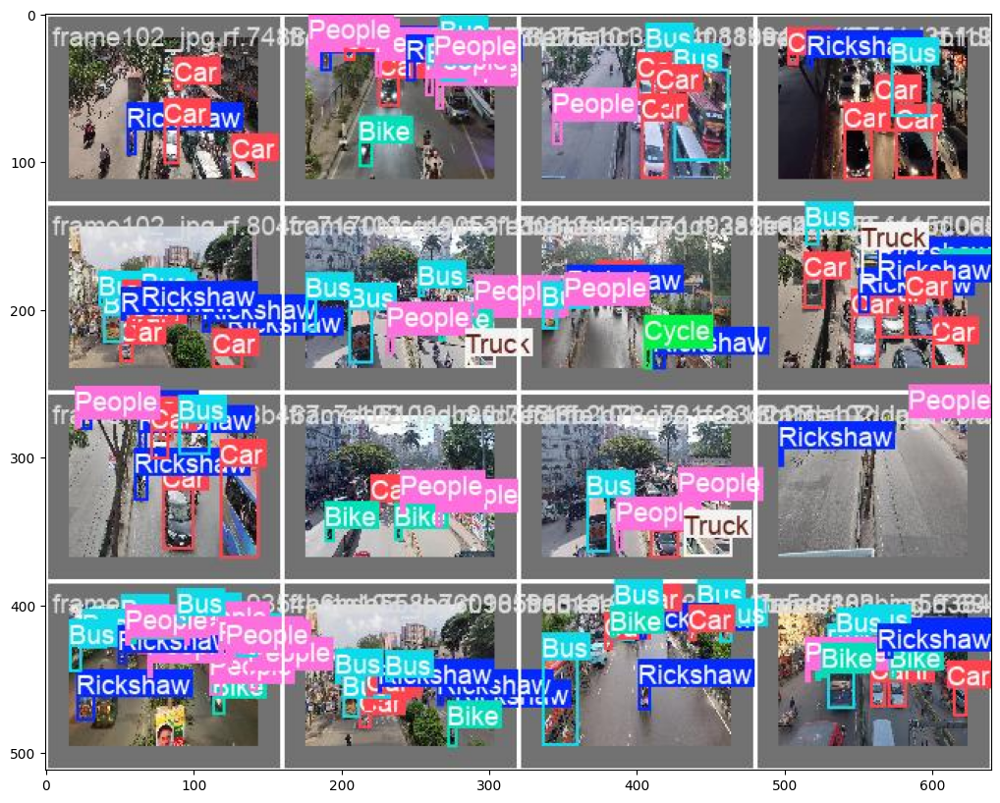

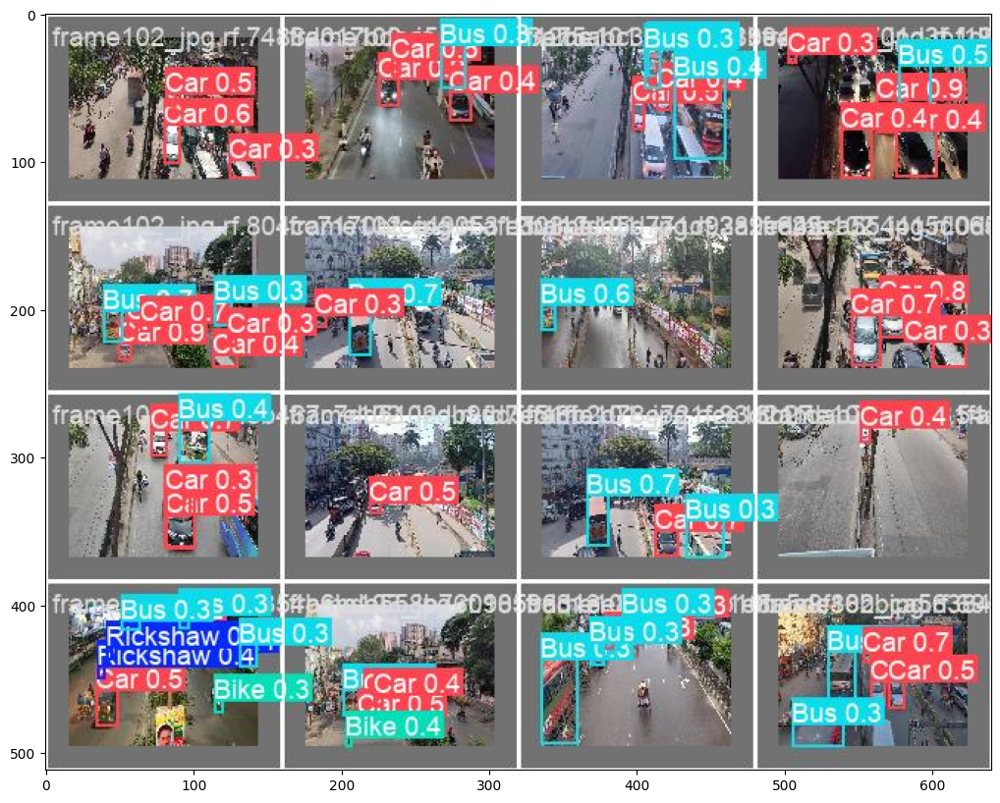

In [36]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [37]:
# ============================================================
# 3. Evaluate on test set + generate plots (outputs in same folder)
# ============================================================
metrics = model.val(
    data=str(DATA),
    split="test",
    plots=True,
    project=str(OUTPUT_FOLDER),  # <- same output folder
    name="val"
)

print("mAP@0.5     :", metrics.box.map50)
print("mAP@[.5:.95]:", metrics.box.map)
print("Precision   :", metrics.box.mp)
print("Recall      :", metrics.box.mr)

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1401.4±304.1 MB/s, size: 73.6 KB)
val: Scanning /kaggle/working/traffic_baseline/yolo_split/test/labels... 2369 images, 6 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2369/2369 1.1Kit/s 2.1s0.1s
val: /kaggle/working/traffic_baseline/yolo_split/test/images/frame195_jpg.rf.46fd02322bca0e4c4437d57807d7a178.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/traffic_baseline/yolo_split/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 149/149 11.1it/s 13.5s0.1s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2369      22991      0.414      0.242      0.206     0.0929
              Rickshaw       1938       5907      0.367      0.194       0.19     0.0576
                   Bus       1957       5228      0.362      0.534       0.41      0.188
                 Truck        115        121     0.0789      0.174     0.0767     0.0545
                  Bike       1087       1666      0.362      0.141      0.144     0.0397
                People       1437       3739      0.305     0.0283     0.0697     0.0176
                   Car       2129       6249      0.425      0.623      0.542      0.292
                 Cycle         79         81          1          0    0.00642    0.00139
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/base_yolov11/val
mAP@0.5     : 0.20554615847030025
mAP@[.5:.95]: 0.09291123276711247
Precision   : 0.4141431800363084
Recall      : 0.24194348272757432


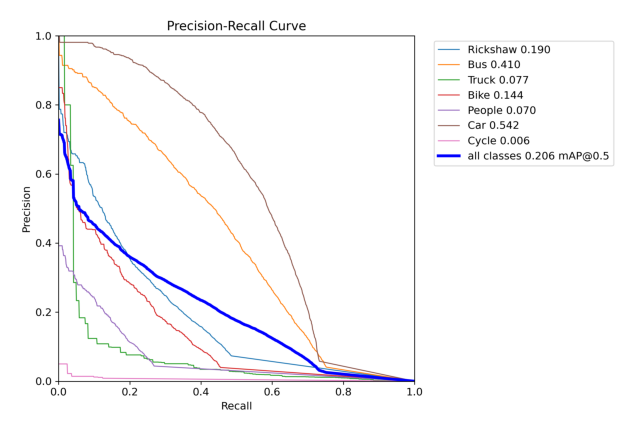

In [38]:
# ============================================================
# 4. Visualize PR curve from custom folder
# ============================================================
pr_curve_file = list((OUTPUT_FOLDER/"val").glob("*PR_curve*.png"))[0]
img = mpimg.imread(pr_curve_file)
plt.figure(figsize=(8,6))
plt.imshow(img)
plt.axis('off')
plt.show()